<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;">

***Аналитическое исследование заведений общественного питания в Москве***
    
**Цель исследования:**
    
1) Изучить данные 
    
2) Провести предобработку данных
    
3) Изучить рынок общественного питания Москвы

4) Найти интересные особенности

5) Сделать промежуточные и общий выводы 
    
    
    
Нам предоставлен датасет moscow_places.csv со следующими данными : 
    
* name — название заведения;
    
* address — адрес заведения;
    
* category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
    
* hours — информация о днях и часах работы;
    
* lat — широта географической точки, в которой находится заведение;
    
* lng — долгота географической точки, в которой находится заведение;
    
* rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
    
* price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
    
* avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона
    
* middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill
    
* middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill,
    
* chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым 

* district — административный район, в котором находится заведение, например Центральный административный округ;

* seats — количество посадочных мест.

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;">

## Изучение данных 

In [1]:
import pandas as pd
import re
from matplotlib import pyplot as plt
import seaborn as sns
from plotly import graph_objects as go
import plotly.express as px
import json 
import folium 
from folium.plugins import MarkerCluster
from folium import Map, Marker

In [2]:
df = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;">
    
С данными все в порядке. В дальнейшем посмотрим что можно исправить и подровнять  

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;"> 
    
## Предобработка данных

In [5]:
df['name'] = df['name'].str.lower()
df['address'] = df['address'].str.lower()

In [6]:
df.duplicated().sum()

0

In [7]:
duprows = df[df.duplicated(['name','address'])]
print(duprows)

                           name  category  \
215                        кафе      кафе   
1511                  more poke  ресторан   
2420  раковарня клешни и хвосты   бар,паб   
3109            хлеб да выпечка      кафе   

                                      address  \
215              москва, парк ангарские пруды   
1511  москва, волоколамское шоссе, 11, стр. 2   
2420               москва, проспект мира, 118   
3109              москва, ярцевская улица, 19   

                                     district  \
215           Северный административный округ   
1511          Северный административный округ   
2420  Северо-Восточный административный округ   
3109          Западный административный округ   

                                                  hours        lat        lng  \
215                              ежедневно, 10:00–22:00  55.881438  37.531848   
1511  пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...  55.806307  37.497566   
2420  пн-чт 12:00–00:00; пт,сб 12:00–01

In [8]:
df.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

In [9]:
 df['street'] = df['address'].str.split(', ').str[1]

In [10]:
df['is_24/7'] = df['hours'].str.contains('ежедневно, круглосуточно')
df['is_24/7'] = df['is_24/7'].fillna(False)

In [11]:
df

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,профсоюзная улица,False
8402,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,пролетарский проспект,False
8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,люблинская улица,True
8404,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,люблинская улица,True


<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;"> 
    
## Изучение данных

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;">
    
**Категории**

In [12]:
category = df['category'].unique()
print('В датафрейме имеется', len(category), 'категорий:', '; '.join(category))

В датафрейме имеется 8 категорий: кафе; ресторан; кофейня; пиццерия; бар,паб; быстрое питание; булочная; столовая


<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;">
    
**Количество объектов общественного питания по категориям**

Text(0.5, 1.0, 'Количество объектов общественного питания по категориям')

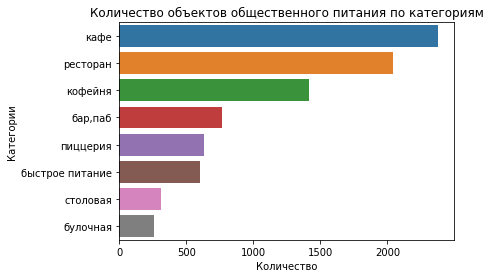

In [13]:
pivot_category = df.pivot_table(index=['category'], values='address', aggfunc='count').sort_values(by = 'address',ascending = False)
pivot_category.columns= ['values']
names_category = pivot_category.index
values = pivot_category['values']


sns.barplot(data = pivot_category , x = values , y = names_category)
plt.xlabel("Количество", size=10)
plt.ylabel("Категории", size=10)
plt.title("Количество объектов общественного питания по категориям")


In [14]:
pivot_category

,values
category,
кафе,2378
ресторан,2043
кофейня,1413
"бар,паб",765
пиццерия,633
быстрое питание,603
столовая,315
булочная,256


<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;">
    
По графику мы видем что тройку лидиров по количеству обектов составляют кафе 28.3% , рестораны 24.3% и кофейни 16.8%.
Все остальные заведения меньше 10 процентов.

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;">
    
**Количество посадочных мест в местах по категориям**

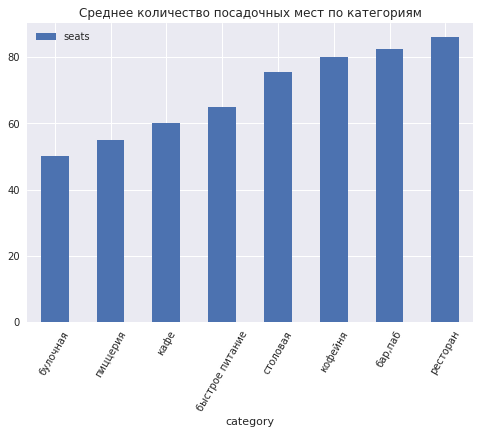

In [15]:
pivot_seats = df.pivot_table(index='category', values='seats', aggfunc = 'median').sort_values(by = 'seats')
with plt.style.context('seaborn'):
    pivot_seats.plot(kind='bar')
plt.title('Среднее количество посадочных мест по категориям')
plt.xticks(rotation=60)
plt.show()

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;">
    
Больше всего посадочных мест имеют бары/пабы , кофейни и рестораны. Меньше всего у столовых и пицерий. 

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;">
    
**Соотношение сетевых и несетевых заведений**

In [16]:
df['chain'] = df['chain'].replace(0 , "несетевой")
df['chain'] = df['chain'].replace(1 , "сетевой")

In [17]:
df.groupby('chain')['category'].count().sort_values()

chain
сетевой      3205
несетевой    5201
Name: category, dtype: int64

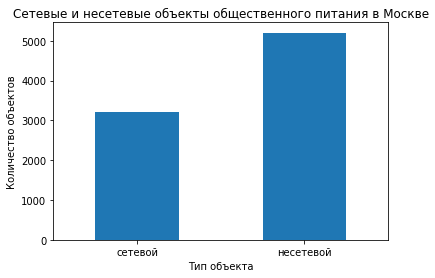

In [18]:
ax = df.groupby('chain')['category'].count().sort_values().plot(kind='bar')
ax.set_title('Сетевые и несетевые объекты общественного питания в Москве')
ax.set_xlabel('Тип объекта')
ax.set_ylabel('Количество объектов')
plt.xticks(rotation=0)
plt.show()

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;">
    
Несетевых заведений общественного питания подавляющее большинство. 
    
* Сетевых заведений - 3205
    
* Несетевых = 5201

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;">
    
**Категории сетевых и несетевых заведений**

In [19]:
chain_places = df[df['chain'] == 'сетевой']
nochain_places = df[df['chain'] == 'несетевой']

In [20]:
ch = pd.DataFrame(df.pivot_table(index = 'category' , values = 'name', columns = 'chain',  aggfunc = 'count' ))
ch['sum'] = ch.sum(axis=1)
chh = ch.sort_values(by='sum' ,  ascending = False).drop('sum' , axis = 1 )

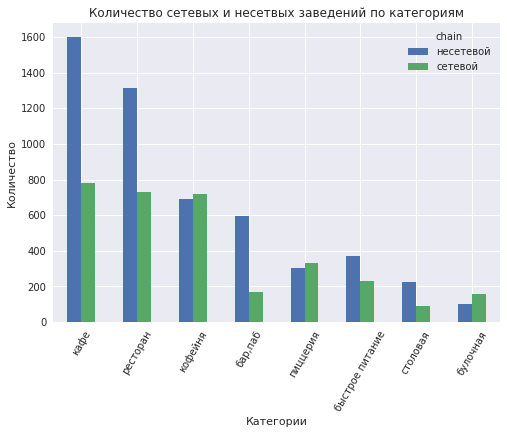

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;">
    
По графику мы видим что кафе , кафейни и рестораны чаще являются сетевыми заведениями общественного питания.
    
    
У несетевых заведений лидирами по количеству обьектов являются кафе и рестораны.

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;">
    
**Tоп-15 популярных сетей в Москве.**

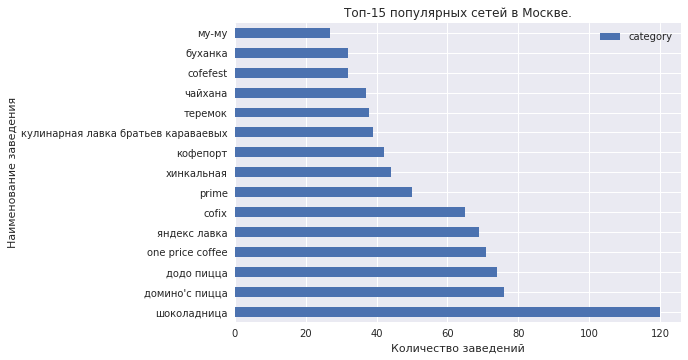

,category
name,
шоколадница,120
домино'с пицца,76
додо пицца,74
one price coffee,71
яндекс лавка,69
cofix,65
prime,50
хинкальная,44
кофепорт,42


In [22]:
top_name = pd.DataFrame(chain_places.groupby('name').count().sort_values(by='category', ascending=False).head(15)['category'])
with plt.style.context('seaborn'):
    top_name.plot(kind='barh')
plt.title('Tоп-15 популярных сетей в Москве.')
plt.xlabel('Количество заведений')
plt.ylabel('Наименование заведения')
plt.show()
top_name

Text(0.5, 1.0, 'Популярные сетевые категории')

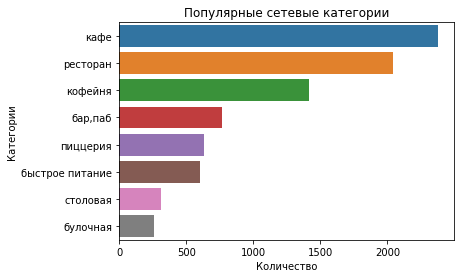

In [23]:
top_name = pd.DataFrame(chain_places.groupby('name').count().sort_values(by='category', ascending=False).head(15)['category'])
sns.barplot(data = top_name , x = values , y = names_category) 
plt.xlabel("Количество", size=10)
plt.ylabel("Категории", size=10)
plt.title("Популярные сетевые категории")

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;">
    
Самыми популярными сетевыми заведениями в Москве являются :
    
* Шоколадница - кофейня/кафе - 120 заведений
    
* Домино'с Пицца - пиццерия - 76 заведений 
    
* Додо Пицца - пиццерия - 74 заведения
    
Самыми популярными сетевыми категориями в Москве являются :
    
* Пиццерии - 28.3%
    
* Булочные - 24.3%
    
* Бары/пабы - 16.8%

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;">
    
**Распределение категорий по районам**

In [24]:
dis = df['district'].unique()
print('В датасете присутствуют' , len(dis) , 'административных районов. А именно :', dis )

В датасете присутствуют 9 административных районов. А именно : ['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']


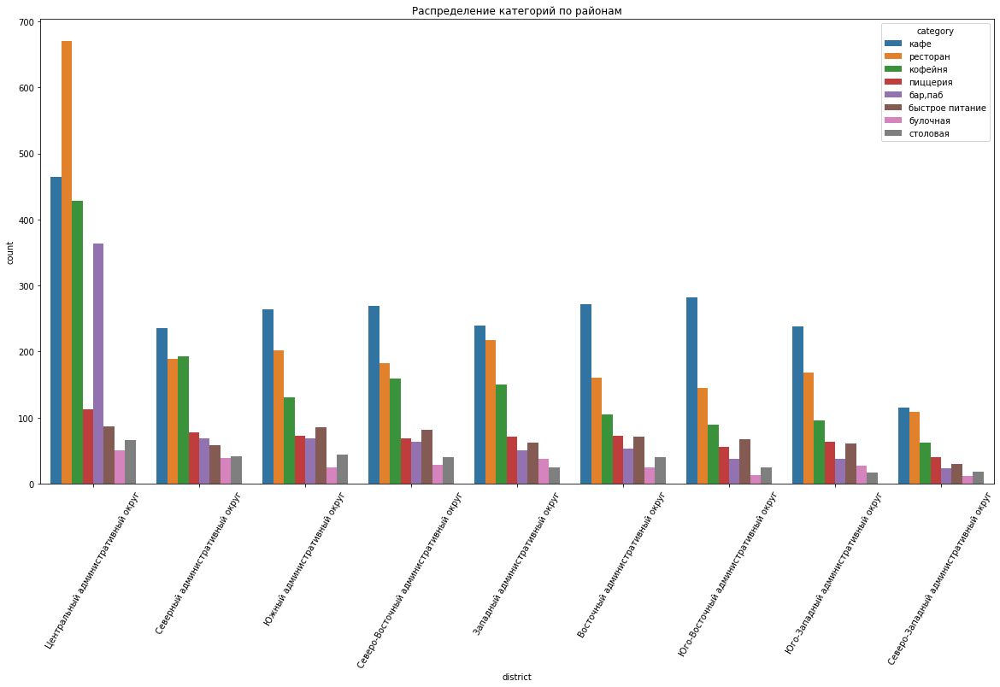

In [25]:
plt.figure(figsize=(20, 10))
sns.countplot(x='district', hue='category', data=df , order=df['district'].value_counts().index)
plt.xticks(rotation=60)
plt.title('Распределение категорий по районам')
plt.show()

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;">
    
Центральный административный округ конечно выделяется по количеству заведений в нем.  

Также можно заметить что в остальных округах , если не брать в счет цао , лидирующие позиции по количеству заведений занимают кафе. В принципе мы можем наблюдать схожую обстановку по количеству и других заведений. Во всех районах больше всего кафе ресторанов  и кофеен. 
   
В центре можно выделить большие показатели  баров пабов , чего нет в других районах.    

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;">
    
**Распределение средних рейтингов по категориям заведений**

In [26]:
rat = pd.DataFrame(df.groupby('category')['rating'].mean()).sort_values(by = 'rating')
rat

,rating
category,
быстрое питание,4.050249
кафе,4.123886
столовая,4.211429
булочная,4.268359
кофейня,4.277282
ресторан,4.290357
пиццерия,4.301264
"бар,паб",4.387712


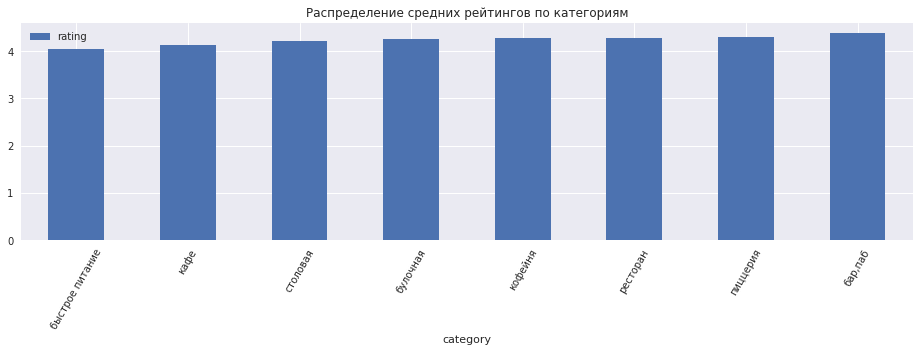

In [27]:
with plt.style.context('seaborn'):
    rat.plot(kind='bar' , figsize=(16, 4))
plt.title('Распределение средних рейтингов по категориям')
plt.xticks(rotation=60)
plt.show()

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;"> 

    
Как мы видим , самые низкие рейтинги у заведений быстрого питания(4.05) , самые высокие у баров и пабов (4.4). Но в принципе 
усредненные рейтинги отличаются не сильно.

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;">
    
**Фоновая картограмма со средним рейтингом заведений каждого района**

In [28]:
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [29]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean')

In [30]:
from folium import Map, Choropleth
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)
m

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;"> 

На карте мы можем заметить что самые высокие средние рейтинги наблюдаются в центре москвы. Самые низкие в Южно-Восточном административнjv округе. Но в целом средние рейтинги не сильно отличаются.  

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;"> 

Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;">
    
**Отображение всех заведений датасета на карте**

In [31]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['category']}",
    ).add_to(marker_cluster)
df.apply(create_clusters, axis=1)

m

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;">
    
**ТОП-15 улиц по коичеству заведений**

In [32]:
def heatmap(data, index, columns, values, aggfunc, title):
    data = data.pivot_table(index=index, columns=columns, values=values, aggfunc=aggfunc)
    plt.figure(figsize=(14,6))
    plt.title(title)
    sns.heatmap(data, annot=True)
    plt.show()

In [33]:
top_st_data = df.pivot_table(index='street', values='name', aggfunc='count').sort_values(by='name', ascending=False).head(15)
top_st = top_st_data.index
top_st_data

,name
street,
проспект мира,184
профсоюзная улица,122
проспект вернадского,108
ленинский проспект,107
ленинградский проспект,95
дмитровское шоссе,88
каширское шоссе,77
варшавское шоссе,76
ленинградское шоссе,70


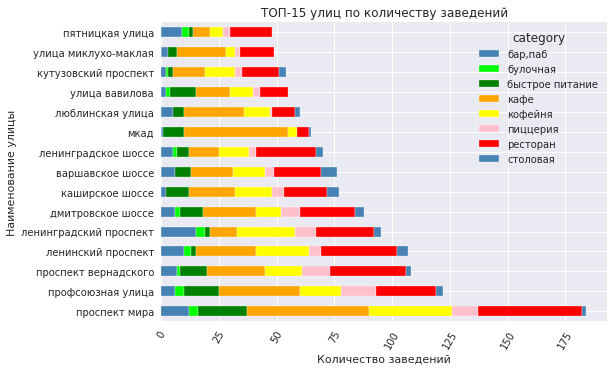

In [34]:
top_st_data = df.query('street in @top_st')
tp = top_st_data.pivot_table( index =  'street' , values = 'name' , columns = 'category', aggfunc='count' )
tp['sum'] =  tp.sum(axis = 1)
tpp  =  tp.sort_values(by='sum', ascending = False).drop('sum', axis=1)
tpp.sort_values(by='street')
sns.set (style='white')
#create stacked bar chart
with plt.style.context('seaborn'):
    tpp.plot(kind='barh', stacked= True , color=['steelblue', 'lime' , 'green' , 'orange' , 'yellow' , 'pink' , 'red' ])
plt.title('ТОП-15 улиц по количеству заведений')
plt.xlabel('Количество заведений')
plt.ylabel('Наименование улицы')
plt.xticks(rotation=60)
plt.show()   

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;">

Проспект Мира является лидирующей улицей по количеству заведений на ней. Обьясняется это большим количеством кафе , ресторанов и кофеен на ней.
2-ое место по количеству заведений занимает улица Профсоюзная.

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;">
    
**Улицы, на которых находится только один объект общепита.**

In [35]:
one_street = df.pivot_table(index='street', values='name', aggfunc='count').sort_values(by='name')
one_street.columns = ['count']
one_street= one_street[one_street['count'] == 1]
one_street

,count
street,
1-й автозаводский проезд,1
новосущёвская улица,1
новощукинская улица,1
новоясеневский тупик,1
одинцовская улица,1
...,...
верхняя улица,1
1-й голутвинский переулок,1
1-й новокузнецкий переулок,1


In [36]:
one_street_count = one_street.index
one_street_data = df.query('street in @one_street_count')

In [37]:
categories_one_rest = one_street_data.groupby('category') \
                                   .agg(count=('name', 'count')) \
                                   .sort_values(by='count', ascending=False) \
                                   .reset_index()
categories_one_rest

,category,count
0,кафе,159
1,ресторан,93
2,кофейня,84
3,"бар,паб",39
4,столовая,36
5,быстрое питание,23
6,пиццерия,15
7,булочная,8


In [38]:
dist_one_rest = one_street_data.groupby('district') \
                                   .agg(count=('name', 'count')) \
                                   .sort_values(by='count', ascending=False) \
                                   .reset_index()

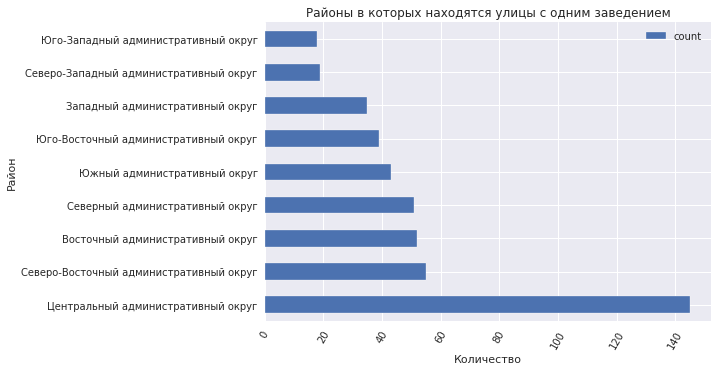

In [39]:
with plt.style.context('seaborn'):
    dist_one_rest.plot(kind='barh', x = 'district')
plt.title('Районы в которых находятся улицы с одним заведением')
plt.xlabel('Количество')
plt.ylabel('Район')
plt.xticks(rotation=60)
plt.show() 

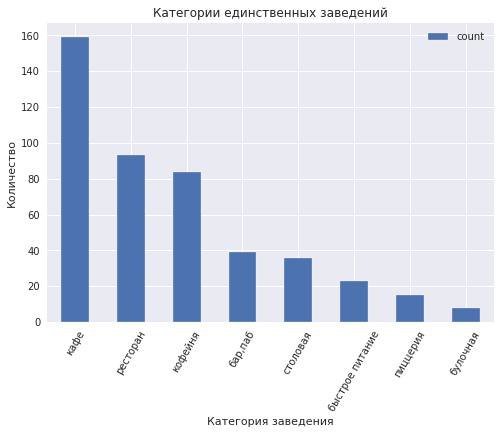

In [40]:
with plt.style.context('seaborn'):
    categories_one_rest.plot(kind='bar', x = 'category')
plt.title('Категории единственных заведений')
plt.xlabel('Категория заведения')
plt.ylabel('Количество')
plt.xticks(rotation=60)
plt.show() 

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;"> 

Всего было найдено 458 улиц на которых находится всего одно заведение общепита. Большинство таких улиц находятся в центральном
административном округе. Большинство таких заведений это кафе , рестораны и кофейни.

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;">
    
**Значения средних чеков по районам.**

In [41]:
avg_df = df.groupby('district', as_index=False)['middle_avg_bill'].agg('median').sort_values(by='middle_avg_bill', ascending = False)
avg_df

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [42]:
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=avg_df,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Значения средних чеков по районам',
).add_to(m)

# выводим карту
m

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;"> 

На карте мы видим что самые дорогие заведения находятся в центре москвы а также на Юго-Западе столицы. С центром ситуация 
понятна. Чем ближк к Кремлю тем  дороже. А вот высокие цены в Юго-западном районе скорее всего связаны с наличием  мест 
достопремичательностей в нем. Ведь там находится смотровая площадка , МГУ и тд. Соответсвенно стоимость недвижимости и 
аренды намного выше , от того и средний чек в заведениях.

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;">
    
**Промежуточный вывод**
    
Нами было произведено исследование данных в ходе которого мы нашли следующие закономерности :
    
* В датафрейме имеется 8 категорий: кафе , ресторан , кофейня , пиццерия , бар/паб , быстрое питание , булочная , столовая
    
* Тройку лидиров по количеству обектов составляют кафе 28.3% , рестораны 24.3% и кофейни 16.8%.
    
* Больше всего посадочных мест имеют бары/пабы , кофейни и рестораны.
    
* Несетевых заведений общественного питания подавляющее большинство.

* Кафе , кафейни и рестораны чаще являются сетевыми заведениями общественного питания
    
* Самыми популярными сетевыми заведениями в Москве являются : Шоколадница , Домино'с Пицца и Додо Пицца.

* Самыми популярными сетевыми категориями в Москве являются пиццерии , булочные  и бары/пабы.
    
* Центральный административный округ - наиболее популярное место по количеству заведений общественного питания.
    
* Самые высокие у баров и пабов (4.4)
    
* Самые высокие средние рейтинги у заведений - в центре москвы.
    
* Самые низкие в Северо-Восточном и Южно-Восточном административных округах. 
    
* Всего было найдено 458 улиц на которых находится всего одно заведение общепита. Большинство таких улиц находятся в центральном административном округе. Большинство таких заведений это кафе , рестораны и кофейни.
    
* Самые дорогие заведения находятся в центре москвы а также на Юго-Западе столицы. 

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;"> 
    
## Детализируем исследование: открытие кофейни

In [43]:
def map(data, group, column, agg, title):
    rating_df = data.groupby(group, as_index=False)[column].agg(agg)
    
    # загружаем JSON-файл с границами округов Москвы
    state_geo = '/datasets/admin_level_geomap.geojson'
    # moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
    moscow_lat, moscow_lng = 55.751244, 37.618423
    
    # создаём карту Москвы
    m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
    
    # создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
    Choropleth(
        geo_data=state_geo,
        data=rating_df,
        columns=[group, column],
        key_on='feature.name',
        fill_color='YlGn',
        fill_opacity=0.8,
        legend_name=title,
    ).add_to(m)
    
    # выводим карту
    return m

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;">
    
**Количество кофеен в датасете**

In [44]:
coffee_df = df[df['category'] == 'кофейня']
len(coffee_df)

1413

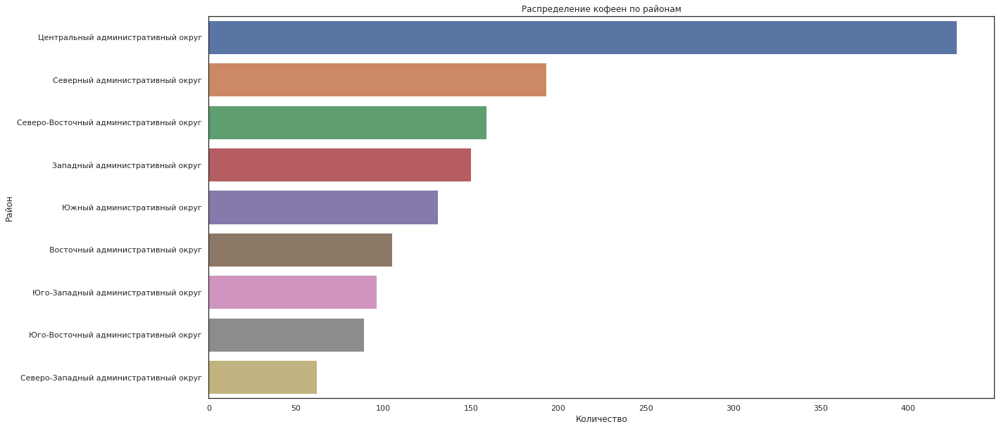

In [45]:
plt.figure(figsize=(20, 10))
sns.countplot(y='district', data=coffee_df , order=coffee_df['district'].value_counts().index)
plt.title('Распределение кофеен по районам')
plt.xlabel('Количество')
plt.ylabel('Район')
plt.show()

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;"> 

Подавляющее количество кофеен находится в центральном административном округе. 

In [46]:
map(coffee_df, 'district', 'name', 'count', 'Количество кофеен по районам')

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;">
    
**Количество круглосуточных кофеен**

In [47]:
nig = round(coffee_df.pivot_table(index= 'district' , values = 'is_24/7' , aggfunc = 'sum').sort_values(by='is_24/7' , ascending = False))
nig

,is_24/7
district,
Центральный административный округ,26
Западный административный округ,9
Юго-Западный административный округ,7
Восточный административный округ,5
Северный административный округ,5
Северо-Восточный административный округ,3
Северо-Западный административный округ,2
Юго-Восточный административный округ,1
Южный административный округ,1


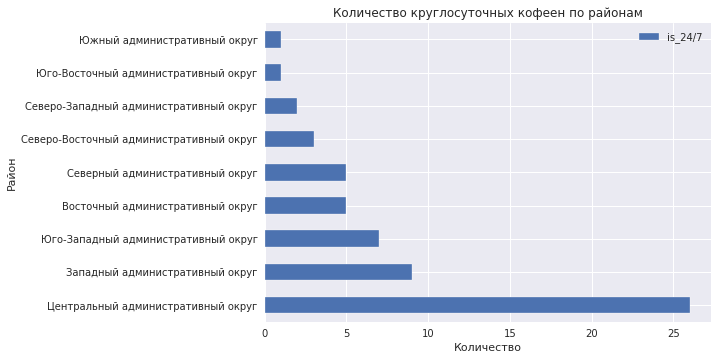

In [48]:
with plt.style.context('seaborn'):
    nig.plot(kind='barh')
plt.title('Количество круглосуточных кофеен по районам')
plt.xlabel('Количество')
plt.ylabel('Район')
plt.show()

In [49]:
coffee_df['is_24/7'].sum()

59

In [50]:
map(coffee_df, 'district', 'is_24/7', 'sum', 'Количество круглосуточных кофеен')

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;"> 

Хоть и количетсво круглосуточных кофеен совсем не велико - 59 , большая часть их также находится в центре.

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;">
    
**Рейтинги кофеен**

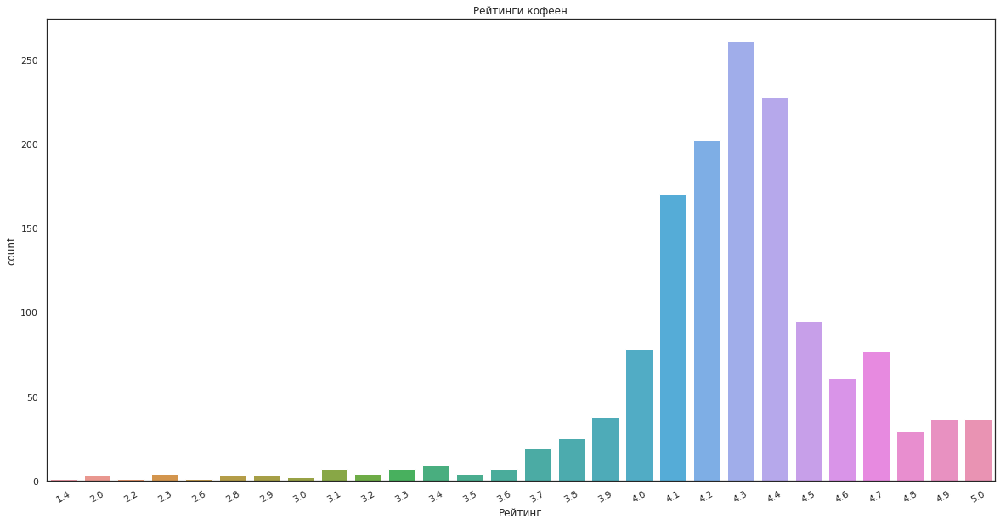

In [51]:
plt.figure(figsize=(20, 10))
sns.countplot(x='rating', data=coffee_df)
plt.xticks(rotation=30)
plt.title('Рейтинги кофеен')
plt.xlabel("Рейтинг")
plt.show()

<div class="alert alert-block alert-warning">

**Комментарий ревьювера (что можно улучшить)**
    
Для распределения количественных данных лучше использовать гистограмму распределения.
</div>


<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;"> 

Кофейни имеют абсолютно разнообразные рейтинги начиная от 1.4 до 5.0. Однако большинство кофеен имеют средний рейтинг в 
районе 4.1-4.4. 

In [52]:
map(coffee_df, 'district', 'rating', 'mean', 'Средний рейтинг кофеен по районам')

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;"> 

Наиболее высокие рейтинги прослежтваются в центральном районе , а также в Северо-Западных административных районах.

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;">
    
**Стоимость чашки капучино**

In [53]:
med_cup = round(coffee_df['middle_coffee_cup'].median())
med_cup

170

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;"> 

В среднем чашка кофе стоит 170 рублей.

In [54]:
map(coffee_df, 'district', 'middle_coffee_cup', 'median', 'Медианная цена чашки капучино')

In [55]:
mid_cup = round(coffee_df.pivot_table(index= 'district' , values = 'middle_coffee_cup' , aggfunc = 'mean').sort_values(by='middle_coffee_cup' , ascending = False))
mid_cup

,middle_coffee_cup
district,
Западный административный округ,190.0
Центральный административный округ,188.0
Юго-Западный административный округ,184.0
Восточный административный округ,174.0
Северный административный округ,166.0
Северо-Западный административный округ,166.0
Северо-Восточный административный округ,165.0
Южный административный округ,158.0
Юго-Восточный административный округ,151.0


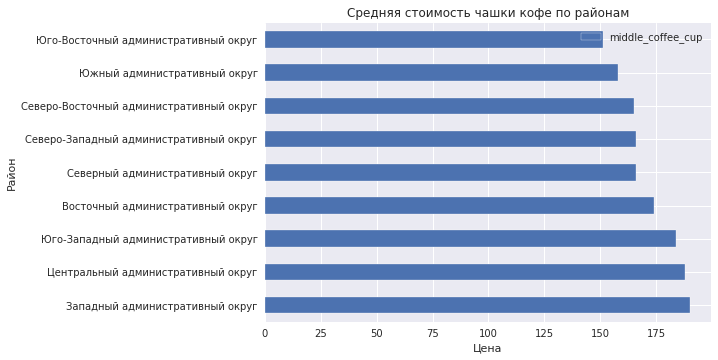

In [56]:
with plt.style.context('seaborn'):
    mid_cup.plot(kind='barh')
plt.title('Средняя стоимость чашки кофе по районам')
plt.xlabel("Цена")
plt.ylabel("Район")
plt.show()

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;"> 

Если смотреть по карте то наиболее высокие цены на чашку кофе соответствуют заведениям с высоким средним чеком .
Центральный и Юго-западный районы имеют самые высокие показатели.

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;"> 

Думаю что при открытии нового заведения  стоит полагаться на цену чуть ниже среднего , в районе 160 рублей , чтобы заявить 
о себе на конкуретной основе.    

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;"> 

Конечно полезной информации не так много , если давать какие то рекомендации по открытию нового заведения. Хотелось бы учесть 
бюджет инвесторов , стоимость арендной платы по москве в целом и другие показатели , которые могут сильно повлиять на выбор. 
Но по тем данным что у нас есть можно отметить , что несмотря на высокую интенсивность разных заведений в  центре  москвы , полагаю
лучше выбрать именно это место для открытия, так как в центре высокая проходимость , соответственно спрос будет больше. Также 
я заметил  что не так много круглосуточных заведений , это может пойти нам на руку. В ночное время  конкурентов меньше. Как было выше 
сказано , так как мы только открываемся то для начала , цену за чашку кофе можно сделать чуть ниже среднего, чтобы привлечь клиентов.

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;"> 
    
## Общий вывод 

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;"> 

В ходе исследования были  произведены следующие действия :
    
* изучены данные 

* произведена предобработка (добавлены новые столбцы в датасет , обнаружены пропуски)

* произведен анализ данных 

* детализированное исследование кофеен Москвы

* сделана презентация по теме 

* написаны промежуточные и общие выводы 
    
Рекомендации по открытию кофейни : 
    
* Предпочтительно Центральный район Москвы 
    
* Круглосуточная  кофейня может быть конкурентно способна  
    
* Цена  за чашку кофе чуть ниже среднего , для привлечения клиентов
   
    


https://disk.yandex.ru/i/IXAaa2NLhwMTfw